<a href="https://colab.research.google.com/github/ramachandrasai7/Simple_GAN_Understanding/blob/main/Simple_GAN_Implementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
from torchvision import datasets,transforms
from torch.utils.data import DataLoader

transform=transforms.ToTensor()


In [2]:
dataset=datasets.MNIST(root='./data',train=True,download=True,transform=transform)

dataloader=DataLoader(dataset,64,drop_last=True)

100%|██████████| 9912422/9912422 [00:00<00:00, 242306704.30it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 113742435.52it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 110726899.19it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 25434617.85it/s]


Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw



In [3]:
images,labels =next(iter(dataloader))


In [4]:
print(labels)

tensor([5, 0, 4, 1, 9, 2, 1, 3, 1, 4, 3, 5, 3, 6, 1, 7, 2, 8, 6, 9, 4, 0, 9, 1,
        1, 2, 4, 3, 2, 7, 3, 8, 6, 9, 0, 5, 6, 0, 7, 6, 1, 8, 7, 9, 3, 9, 8, 5,
        9, 3, 3, 0, 7, 4, 9, 8, 0, 9, 4, 1, 4, 4, 6, 0])


In [5]:
len(labels)

64

In [6]:
images.shape

torch.Size([64, 1, 28, 28])

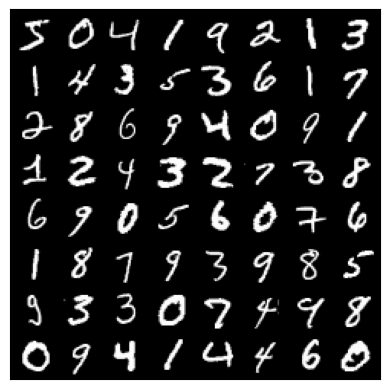

In [7]:
from torchvision.utils import make_grid
import matplotlib.pyplot as plt


def show_image_grid(images: torch.Tensor, ncol: int):
    image_grid = make_grid(images, ncol)     # Make images into a grid
    image_grid = image_grid.permute(1, 2, 0) # Move channel to the last
    image_grid = image_grid.cpu().numpy()    # Convert into Numpy

    plt.imshow(image_grid)
    plt.xticks([])
    plt.yticks([])
    plt.show()


show_image_grid(images, ncol=8)

In [8]:
Z=torch.randn(1,100)
Z

tensor([[-0.2588,  0.4050, -0.4445,  0.9121,  0.0318,  1.0519, -0.3241,  1.1142,
         -2.6261, -1.2497,  0.7579,  0.9176,  1.0119,  1.6209,  1.4935, -1.3161,
         -1.0248, -0.6199, -0.5872,  1.3310,  1.2209,  0.2607, -0.5909, -1.0504,
         -1.6115,  0.9130,  0.0165,  1.3263, -0.9923, -0.9034, -0.3559,  1.0732,
         -1.9182,  0.6507,  0.1807,  0.3637,  0.2793,  0.9803,  2.5204, -0.1655,
          1.4053, -1.3019, -0.4144, -0.3770,  2.1564,  1.1272,  1.5767,  1.0035,
          0.3735, -1.7453, -2.5618, -1.3630, -1.1568, -0.3834,  0.2340,  0.4369,
          1.0036, -0.7887,  0.4044, -0.1446,  0.4120, -0.4970, -1.8060, -0.1244,
          2.2583,  0.7466, -1.0565,  0.2506,  0.1282, -1.2420, -0.6596, -1.2611,
          0.5255, -0.9137,  0.3106,  1.3349,  0.2644, -0.6385, -0.0442, -0.2601,
         -1.1776,  0.1198, -0.9748, -0.1096,  0.4597,  1.1377,  1.5812, -0.4450,
          0.1730,  0.8739,  0.7972,  1.9678,  0.9882, -0.4275,  2.1719, -0.6389,
          1.0184, -0.1430, -

In [9]:
#Generator Network, we take 100 as input dimension and generate  784 which are the size of the images
from torch import nn
generator = nn.Sequential(nn.Linear(100, 128),
                          nn.LeakyReLU(0.01),
                          nn.Linear(128, 784),
                          nn.Sigmoid())

In [10]:
def generate_images():
  z=torch.randn(64,100)
  output=generator(z)
  output=output.reshape(64,1,28,28)
  return output

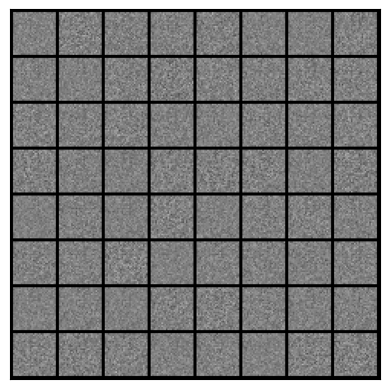

In [11]:
generated_images=generate_images()
show_image_grid(generated_images,8) #these are with out training the generator network

In [12]:
#Discriminator Network Takes in images 784 dimension and give a single output
# from torch  import nn.Leak
discriminator=nn.Sequential( nn.Linear(784,128),
                            nn.LeakyReLU(0.01),
                            nn.Linear(128,1)
                            )

In [13]:
discriminator.eval()
with torch.no_grad():
    prediction = discriminator(generated_images.reshape(-1, 784))

print(prediction)

tensor([[-0.0856],
        [-0.0696],
        [-0.0949],
        [-0.0934],
        [-0.0982],
        [-0.1084],
        [-0.1022],
        [-0.1012],
        [-0.1070],
        [-0.1136],
        [-0.1023],
        [-0.0973],
        [-0.0865],
        [-0.1011],
        [-0.0954],
        [-0.0913],
        [-0.0913],
        [-0.0920],
        [-0.1111],
        [-0.1008],
        [-0.0836],
        [-0.1070],
        [-0.1009],
        [-0.1133],
        [-0.1016],
        [-0.0958],
        [-0.0934],
        [-0.1075],
        [-0.0988],
        [-0.1098],
        [-0.1050],
        [-0.1111],
        [-0.1055],
        [-0.0839],
        [-0.1136],
        [-0.1111],
        [-0.0993],
        [-0.0892],
        [-0.0963],
        [-0.1023],
        [-0.0925],
        [-0.0798],
        [-0.0981],
        [-0.0998],
        [-0.0829],
        [-0.0907],
        [-0.0806],
        [-0.0817],
        [-0.0981],
        [-0.1071],
        [-0.1123],
        [-0.1200],
        [-0.

In [14]:
# Ouputs of the images
real_labels=torch.ones(64,1)
fake_labels=torch.zeros(64,1)

In [15]:
# Loss Function
from torch.nn import functional as F
def calculate_loss_discrim(images: torch.Tensor, targets: torch.Tensor):
    prediction = discriminator(images.reshape(-1, 784))
    loss = F.binary_cross_entropy_with_logits(prediction, targets)
    return loss

def calculate_loss_gen(images: torch.Tensor, targets: torch.Tensor):
    prediction = generator(images.reshape(-1, 784))
    loss = F.binary_cross_entropy_with_logits(prediction, targets)
    return loss

In [16]:
#optimizer
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=1.0e-4)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=1.0e-4)


In [17]:
epochs=100
batch_size=64

In [18]:
import numpy as np

100%|██████████| 937/937 [00:21<00:00, 43.70it/s]


0 0.0696032136478075 6.845407335264579
0


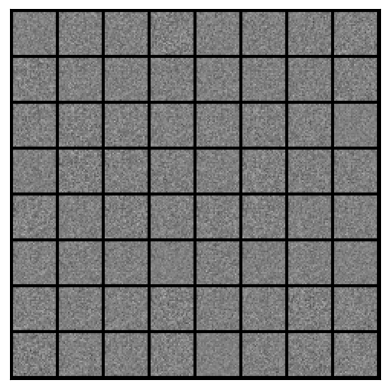

100%|██████████| 937/937 [00:12<00:00, 73.01it/s]


1 0.0013031130305653463 9.655743847280073
1


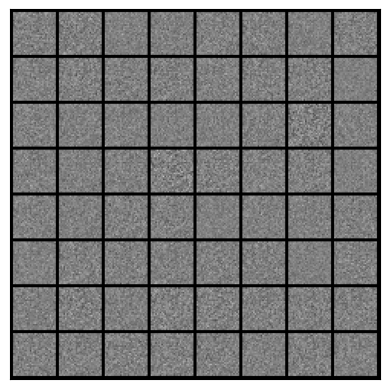

100%|██████████| 937/937 [00:13<00:00, 69.00it/s]


2 0.0004127855054369649 10.807429334015577
2


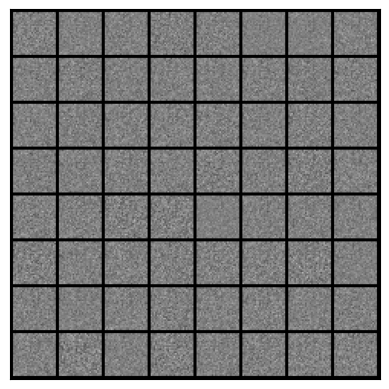

100%|██████████| 937/937 [00:13<00:00, 68.75it/s]


3 0.00018046060179235362 11.641321463162514
3


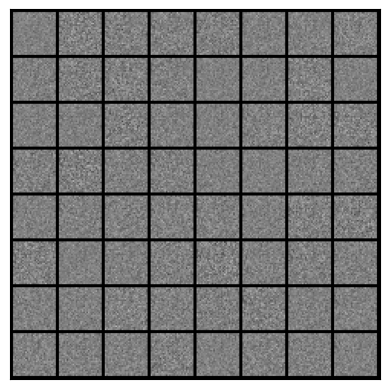

100%|██████████| 937/937 [00:13<00:00, 69.54it/s]


4 9.031056648234681e-05 12.339989128845605
4


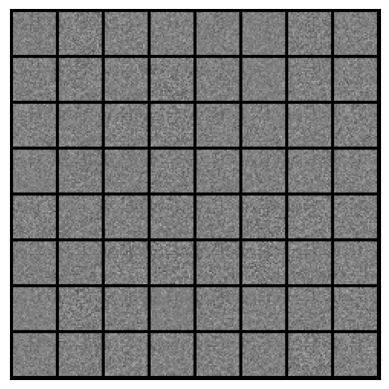

100%|██████████| 937/937 [00:13<00:00, 68.97it/s]


5 4.8519420019382116e-05 12.968852379024346
5


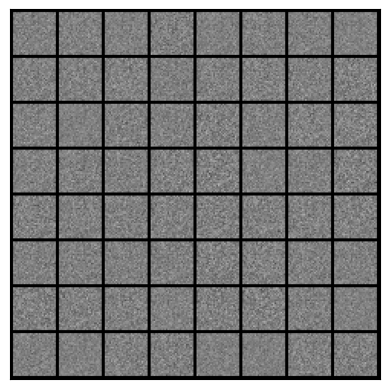

100%|██████████| 937/937 [00:14<00:00, 65.25it/s]


6 2.718107963100182e-05 13.557261860866811
6


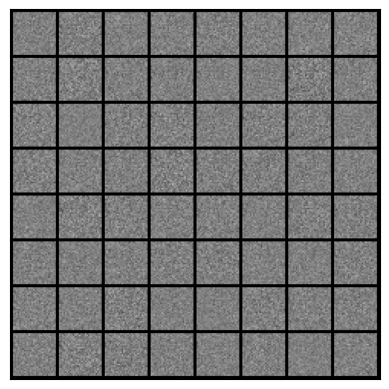

100%|██████████| 937/937 [00:13<00:00, 67.34it/s]


7 1.5638146536647357e-05 14.123112272427456
7


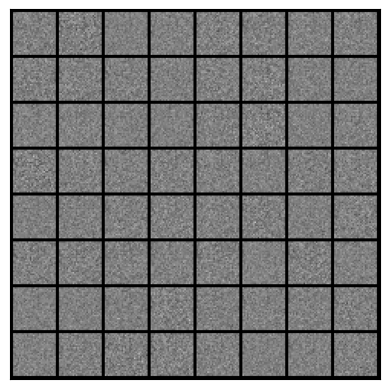

100%|██████████| 937/937 [00:14<00:00, 66.18it/s]


8 9.160657795298422e-06 14.674266046749999
8


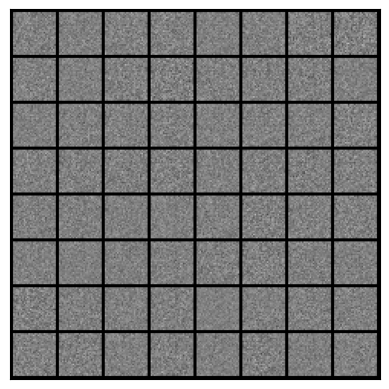

100%|██████████| 937/937 [00:14<00:00, 63.59it/s]


9 5.4368453749955016e-06 15.216175057971999
9


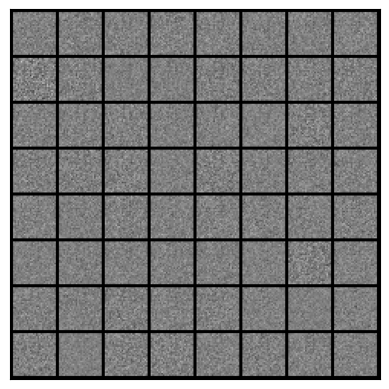

100%|██████████| 937/937 [00:14<00:00, 65.01it/s]


10 3.255416553221838e-06 15.74783977398623
10


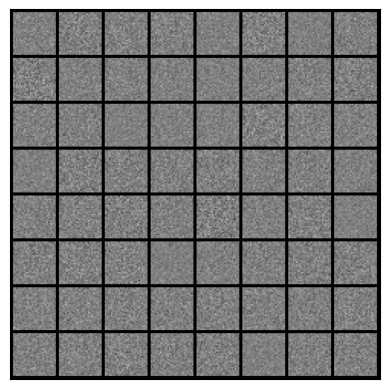

100%|██████████| 937/937 [00:14<00:00, 64.43it/s]


11 1.9855426775145424e-06 16.27588703945327
11


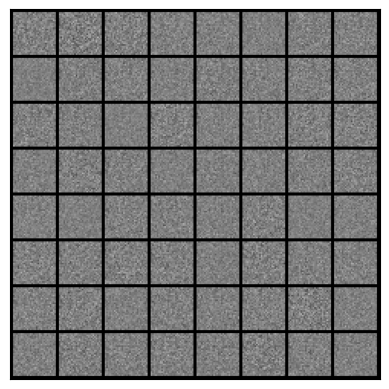

100%|██████████| 937/937 [00:14<00:00, 65.73it/s]


12 1.18016067932317e-06 16.79637341005698
12


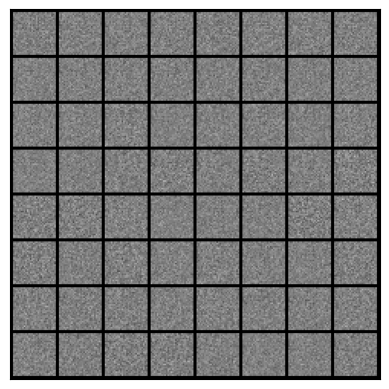

100%|██████████| 937/937 [00:14<00:00, 66.06it/s]


13 7.034673393920525e-07 17.31171328891685
13


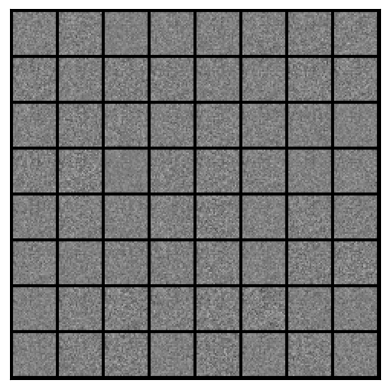

100%|██████████| 937/937 [00:14<00:00, 65.79it/s]


14 4.3221170656274203e-07 17.82023509665767
14


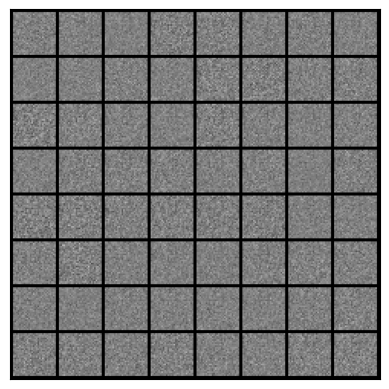

100%|██████████| 937/937 [00:15<00:00, 60.59it/s]


15 2.67997127707114e-07 18.31810304932813
15


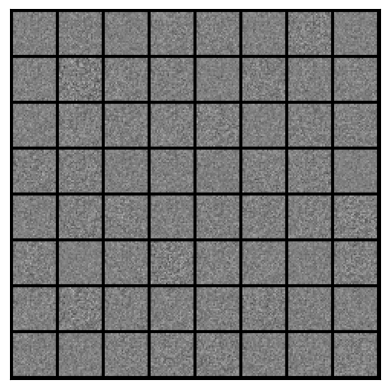

100%|██████████| 937/937 [00:14<00:00, 64.50it/s]


16 1.6707960161480335e-07 18.80335375033677
16


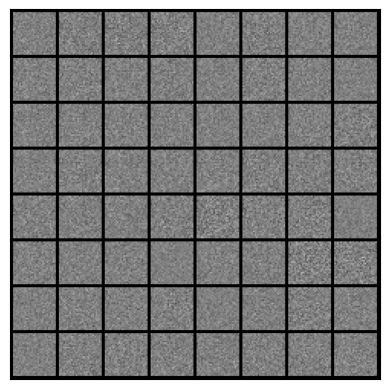

100%|██████████| 937/937 [00:14<00:00, 63.89it/s]


17 1.049257324721802e-07 19.275103763429687
17


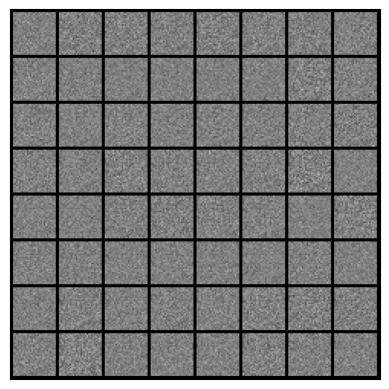

100%|██████████| 937/937 [00:14<00:00, 63.67it/s]


18 6.630461515135367e-08 19.731557988560695
18


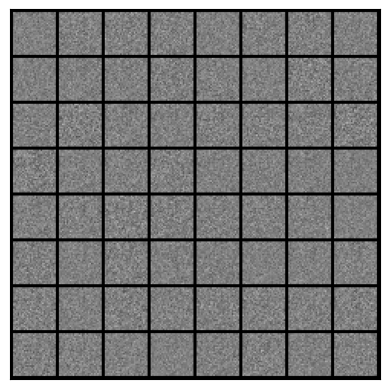

100%|██████████| 937/937 [00:15<00:00, 61.29it/s]


19 4.232345314816483e-08 20.178691061990875
19


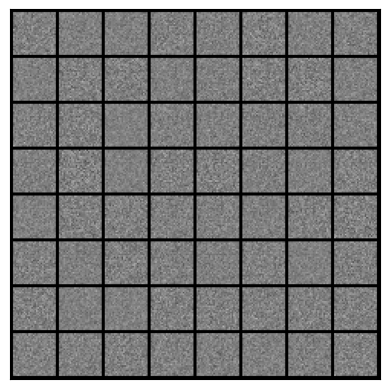

100%|██████████| 937/937 [00:15<00:00, 60.71it/s]


20 2.7249636077409913e-08 20.608799279944748
20


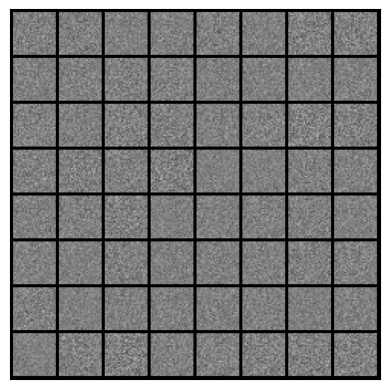

100%|██████████| 937/937 [00:15<00:00, 61.93it/s]


21 1.7690044510708774e-08 21.036829892446544
21


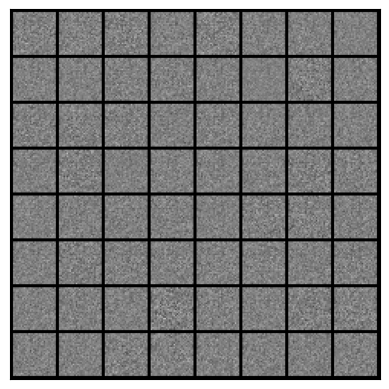

100%|██████████| 937/937 [00:15<00:00, 62.09it/s]


22 1.159923545058597e-08 21.45500032268186
22


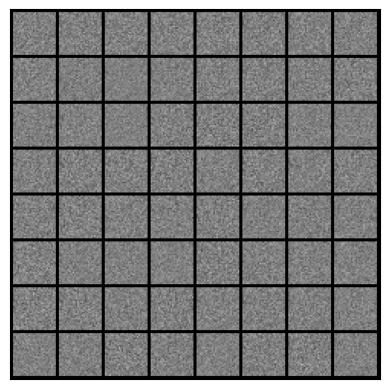

100%|██████████| 937/937 [00:15<00:00, 60.96it/s]


23 7.70500339423269e-09 21.86571636016748
23


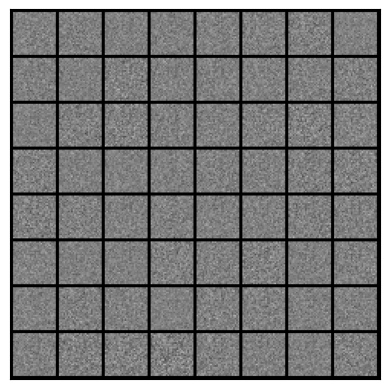

100%|██████████| 937/937 [00:15<00:00, 60.73it/s]


24 5.1426371903950925e-09 22.271719789046998
24


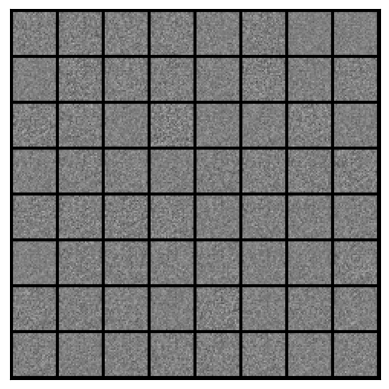

100%|██████████| 937/937 [00:15<00:00, 61.49it/s]


25 3.482762340233319e-09 22.67668724467177
25


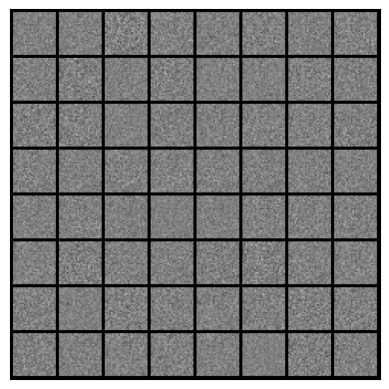

100%|██████████| 937/937 [00:15<00:00, 60.06it/s]


26 2.3775032437264702e-09 23.05119065413989
26


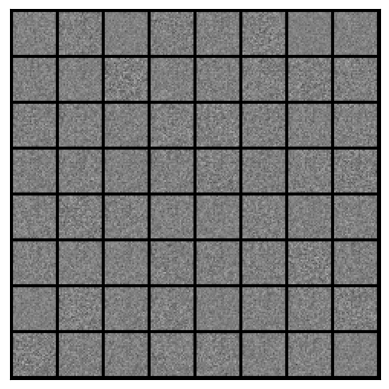

100%|██████████| 937/937 [00:16<00:00, 55.78it/s]


27 1.6598795138093995e-09 23.407683613715076
27


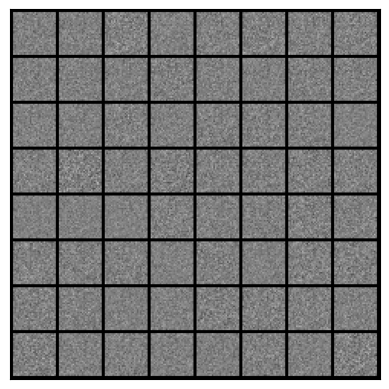

100%|██████████| 937/937 [00:16<00:00, 57.94it/s]


28 1.1589341368471238e-09 23.734965264351924
28


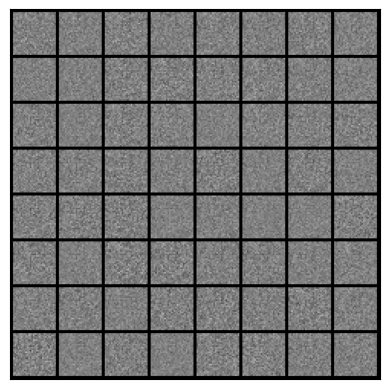

100%|██████████| 937/937 [00:16<00:00, 57.23it/s]


29 8.190067697909413e-10 24.037200382196026
29


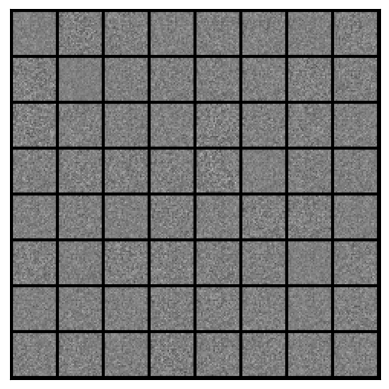

100%|██████████| 937/937 [00:16<00:00, 57.65it/s]


30 5.844369392564698e-10 24.304399748876484
30


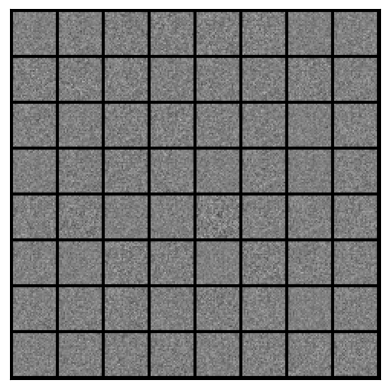

100%|██████████| 937/937 [00:16<00:00, 57.22it/s]


31 4.293822791690693e-10 24.54428576303521
31


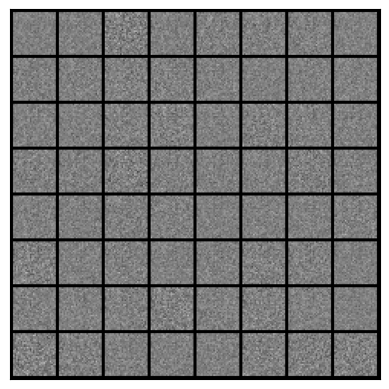

100%|██████████| 937/937 [00:16<00:00, 57.35it/s]


32 3.1806096911921675e-10 24.761098403686393
32


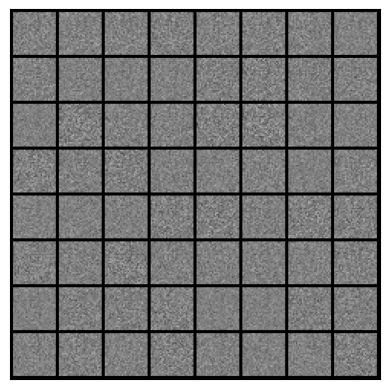

100%|██████████| 937/937 [00:16<00:00, 58.00it/s]


33 2.4450937965894097e-10 24.9556520537353
33


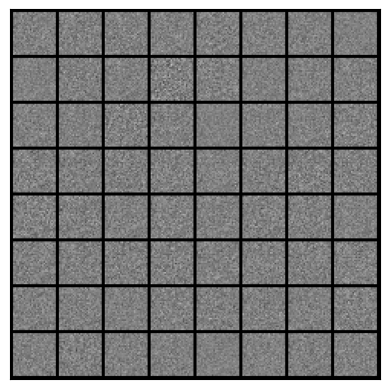

100%|██████████| 937/937 [00:16<00:00, 57.23it/s]


34 1.928244800875554e-10 25.120831016288115
34


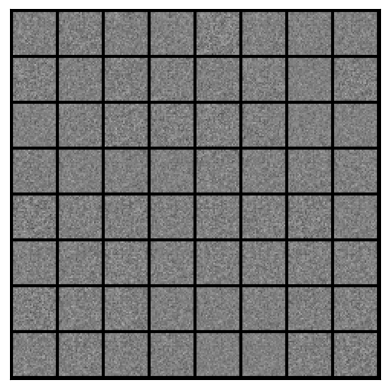

100%|██████████| 937/937 [00:16<00:00, 55.26it/s]


35 1.570426230655546e-10 25.279769178897364
35


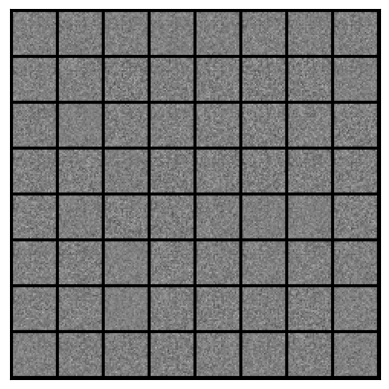

100%|██████████| 937/937 [00:16<00:00, 56.33it/s]


36 1.3915169479152816e-10 25.410054814472016
36


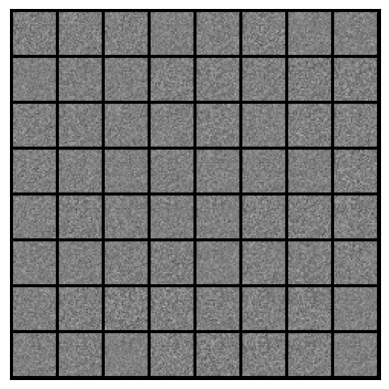

100%|██████████| 937/937 [00:16<00:00, 57.67it/s]


37 1.1927288268865179e-10 25.51879668668342
37


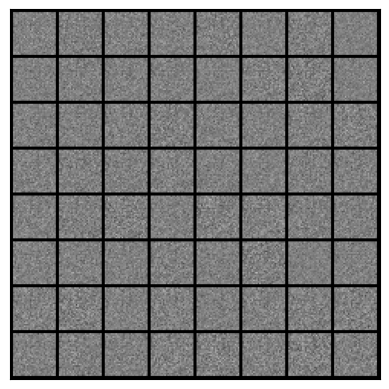

100%|██████████| 937/937 [00:17<00:00, 54.97it/s]


38 9.740618794179528e-11 25.63669841037616
38


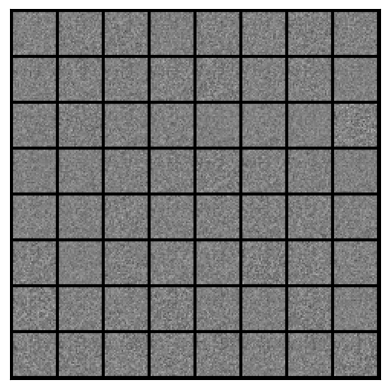

100%|██████████| 937/937 [00:36<00:00, 25.71it/s]


39 8.547890096443822e-11 25.750558313717836
39


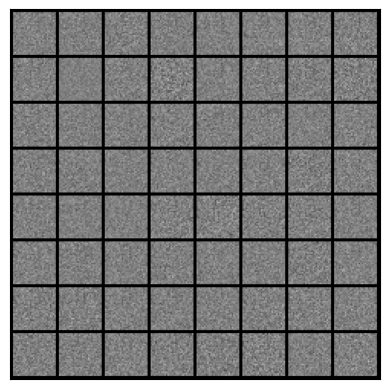

100%|██████████| 937/937 [00:17<00:00, 52.76it/s]


40 7.951525706105523e-11 25.851399438994417
40


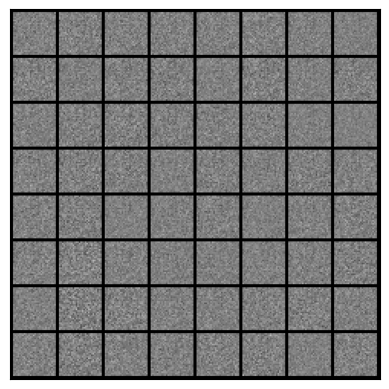

100%|██████████| 937/937 [00:17<00:00, 52.20it/s]


41 6.758796949126326e-11 25.94550976503875
41


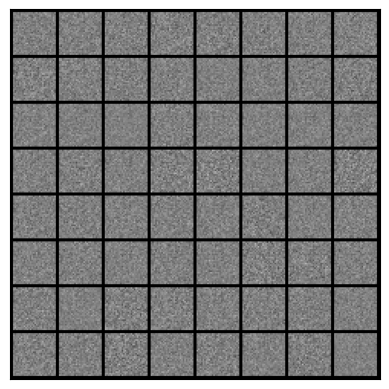

100%|██████████| 937/937 [00:17<00:00, 53.29it/s]


42 6.361220657304265e-11 26.03091458144539
42


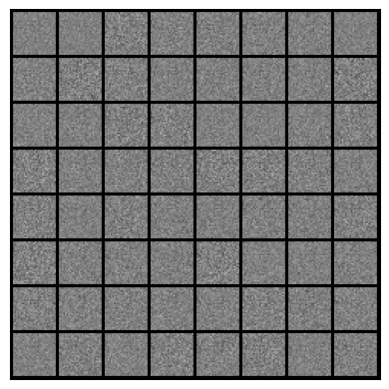

100%|██████████| 937/937 [00:17<00:00, 54.42it/s]


43 5.963644377330904e-11 26.10386463315917
43


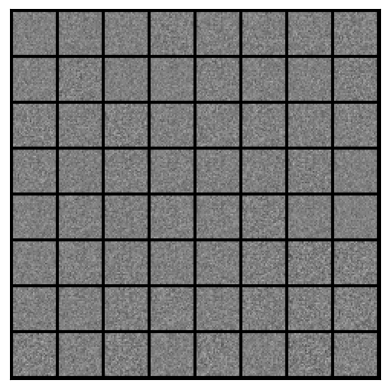

100%|██████████| 937/937 [00:17<00:00, 53.47it/s]


44 5.1684918766276705e-11 26.18138042152755
44


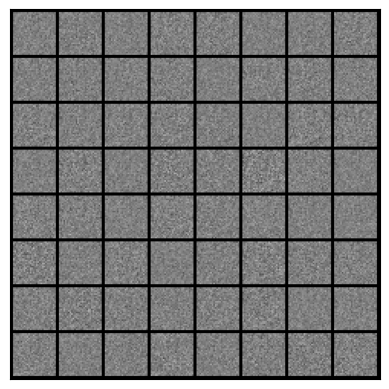

100%|██████████| 937/937 [00:18<00:00, 51.34it/s]


45 4.373339340378343e-11 26.261909098101018
45


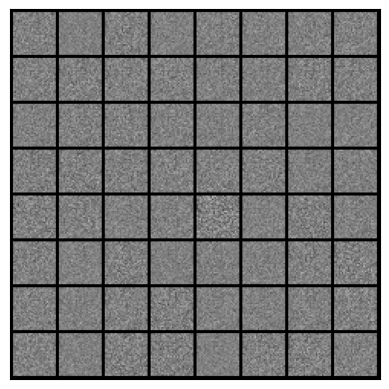

100%|██████████| 937/937 [00:17<00:00, 55.05it/s]


46 4.373339340378343e-11 26.33474182242899
46


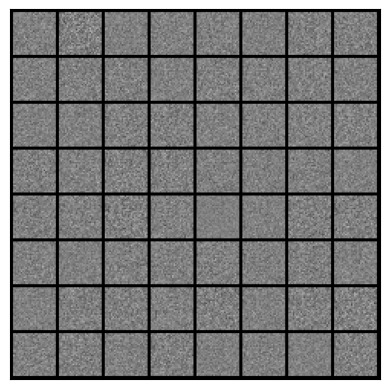

100%|██████████| 937/937 [00:18<00:00, 51.90it/s]


47 4.1745511826186146e-11 26.40064832673129
47


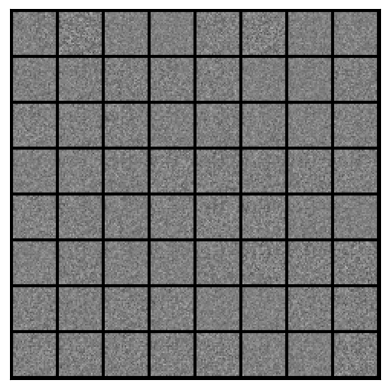

100%|██████████| 937/937 [00:17<00:00, 53.36it/s]


48 3.975763024858886e-11 26.459073574591343
48


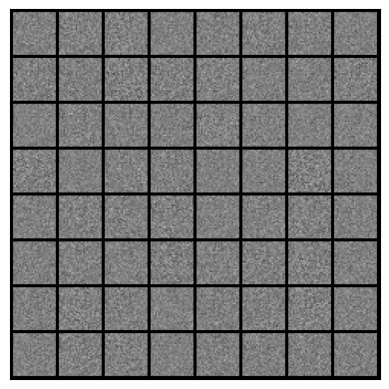

100%|██████████| 937/937 [00:17<00:00, 53.47it/s]


49 3.975763024858886e-11 26.511067637766185
49


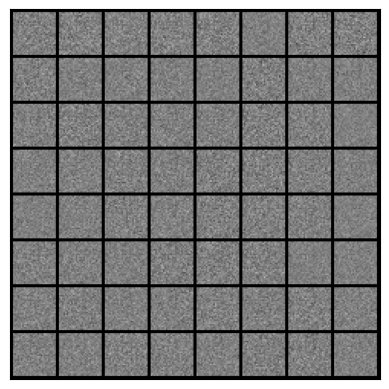

100%|██████████| 937/937 [00:18<00:00, 50.86it/s]


50 3.975763024858886e-11 26.558435006482625
50


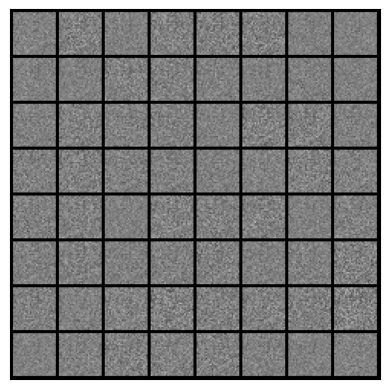

100%|██████████| 937/937 [00:17<00:00, 54.74it/s]


51 3.7769749026452525e-11 26.605188204868117
51


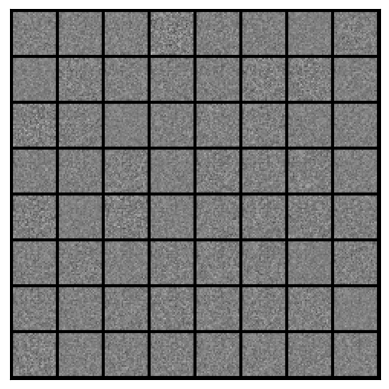

100%|██████████| 937/937 [00:17<00:00, 55.05it/s]


52 3.578186744885524e-11 26.640983101143526
52


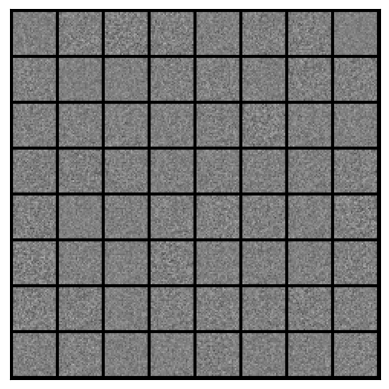

100%|██████████| 937/937 [00:16<00:00, 55.35it/s]


53 3.180610453063464e-11 26.685469107286906
53


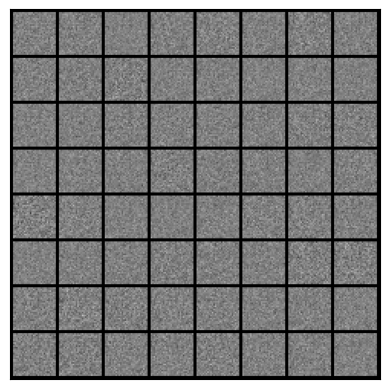

100%|██████████| 937/937 [00:17<00:00, 53.79it/s]


54 2.7830341375440073e-11 26.72499628382533
54


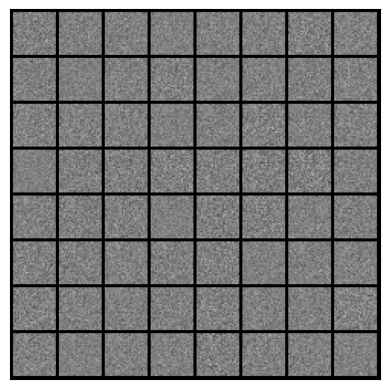

100%|██████████| 937/937 [00:17<00:00, 53.21it/s]


55 2.7830341375440073e-11 26.77198346116627
55


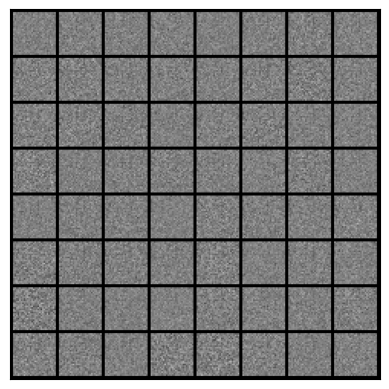

100%|██████████| 937/937 [00:17<00:00, 53.69it/s]


56 2.7830341375440073e-11 26.81409955508172
56


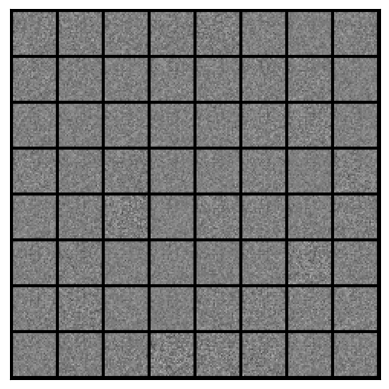

100%|██████████| 937/937 [00:17<00:00, 53.59it/s]


57 2.1866697116596152e-11 26.85701532068731
57


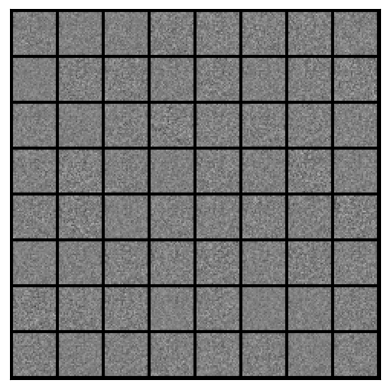

100%|██████████| 937/937 [00:17<00:00, 53.00it/s]


58 2.1866697116596152e-11 26.90180277340949
58


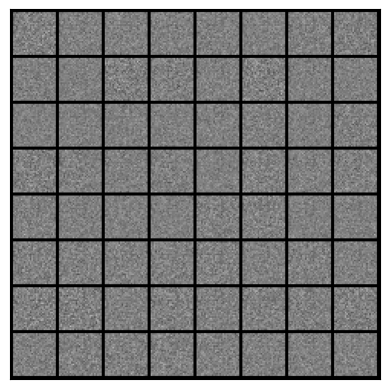

100%|██████████| 937/937 [00:18<00:00, 51.16it/s]


59 2.1866697116596152e-11 26.94351478218396
59


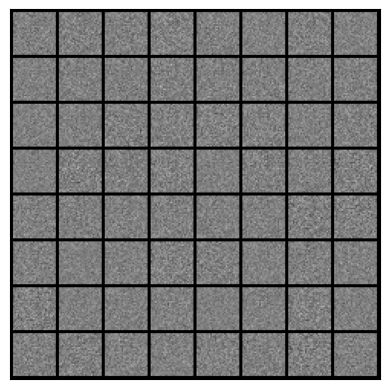

100%|██████████| 937/937 [00:17<00:00, 52.77it/s]


60 1.987881553899887e-11 26.99156030188757
60


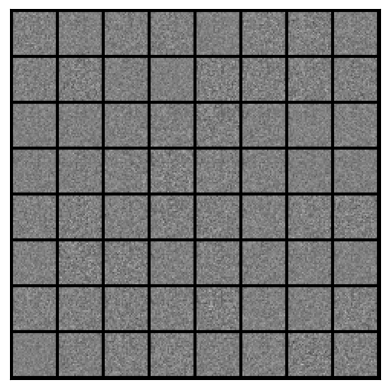

100%|██████████| 937/937 [00:17<00:00, 52.91it/s]


61 1.987881553899887e-11 27.023183368695076
61


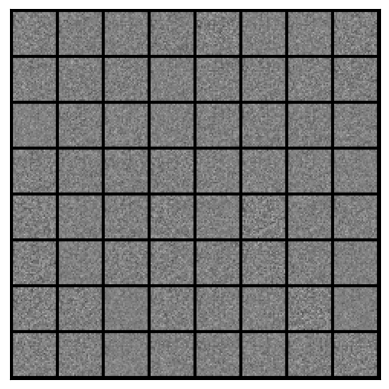

100%|██████████| 937/937 [00:17<00:00, 53.91it/s]


62 1.987881553899887e-11 27.0688473671961
62


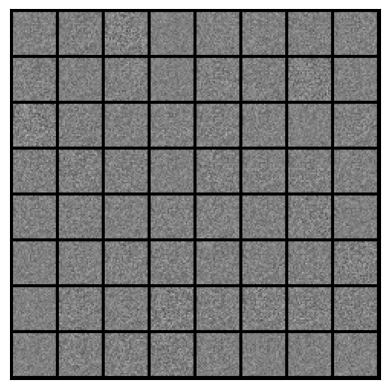

 60%|█████▉    | 562/937 [00:10<00:06, 54.61it/s]


KeyboardInterrupt: ignored

In [19]:
#Discriminator Training
from tqdm import tqdm
for epoch in range(epochs):
  d_losses=[]
  g_losses=[]
  for images,labels in tqdm(dataloader):
    discriminator.train()
    # d_pred=discriminator(images)
    d_loss=calculate_loss_discrim(images,real_labels)
    generator.eval()
    with torch.no_grad():
      generated_images=generate_images()
      # print(generated_images.shape)
      # generated_images=generator(generated_images)
      generated_images = generated_images.reshape(batch_size, 1, 28, 28)

      

    d_loss+=calculate_loss_discrim(generated_images,fake_labels)

    d_optimizer.zero_grad()
    d_loss.backward()
    d_optimizer.step()


    generator.train()
    discriminator.eval()
    g_loss=calculate_loss_discrim(generated_images,real_labels)
    g_optimizer.zero_grad()
    g_loss.backward()
    g_optimizer.step()

    # Keep losses for logging
    d_losses.append(d_loss.item())
    g_losses.append(g_loss.item())

# Print average losses
  print(epoch, np.mean(d_losses), np.mean(g_losses))

  # Save images
  print(epoch)
  show_image_grid(generate_images(),8)



In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from tqdm import tqdm


# Configuration
epochs      = 100
batch_size  = 64
sample_size = 100    # Number of random values to sample
g_lr        = 1.0e-4 # Generator's learning rate
d_lr        = 1.0e-4 # Discriminator's learning rate


# DataLoader for MNIST
transform = transforms.ToTensor()
dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, drop_last=True)


# Generator Network
class Generator(nn.Sequential):
    def __init__(self, sample_size: int):
        super().__init__(
            nn.Linear(sample_size, 128),
            nn.LeakyReLU(0.01),
            nn.Linear(128, 784),
            nn.Sigmoid())

        # Random value vector size
        self.sample_size = sample_size

    def forward(self, batch_size: int):
        # Generate randon values
        z = torch.randn(batch_size, self.sample_size)

        # Generator output
        output = super().forward(z)

        # Convert the output into a greyscale image (1x28x28)
        generated_images = output.reshape(batch_size, 1, 28, 28)
        return generated_images


# Discriminator Network
class Discriminator(nn.Sequential):
    def __init__(self):
        super().__init__(
            nn.Linear(784, 128),
            nn.LeakyReLU(0.01),
            nn.Linear(128, 1))

    def forward(self, images: torch.Tensor, targets: torch.Tensor):
        prediction = super().forward(images.reshape(-1, 784))
        loss = F.binary_cross_entropy_with_logits(prediction, targets)
        return loss


# To save images in grid layout
def save_image_grid(epoch: int, images: torch.Tensor, ncol: int):
    image_grid = make_grid(images, ncol)     # Images in a grid
    image_grid = image_grid.permute(1, 2, 0) # Move channel last
    image_grid = image_grid.cpu().numpy()    # To Numpy

    plt.imshow(image_grid)
    plt.xticks([])
    plt.yticks([])
    plt.savefig(f'generated_{epoch:03d}.jpg')
    plt.close()


# Real and fake labels
real_targets = torch.ones(batch_size, 1)
fake_targets = torch.zeros(batch_size, 1)


# Generator and Discriminator networks
generator = Generator(sample_size)
discriminator = Discriminator()


# Optimizers
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=d_lr)
g_optimizer = torch.optim.Adam(generator.parameters(), lr=g_lr)


# Training loop
for epoch in range(epochs):

    d_losses = []
    g_losses = []

    for images, labels in tqdm(dataloader):
        #===============================
        # Discriminator Network Training
        #===============================

        # Loss with MNIST image inputs and real_targets as labels
        discriminator.train()
        d_loss = discriminator(images, real_targets)

        # Generate images in eval mode
        generator.eval()
        with torch.no_grad():
            generated_images = generator(batch_size)

        # Loss with generated image inputs and fake_targets as labels
        d_loss += discriminator(generated_images, fake_targets)

        # Optimizer updates the discriminator parameters
        d_optimizer.zero_grad()
        d_loss.backward()
        d_optimizer.step()

        #===============================
        # Generator Network Training
        #===============================

        # Generate images in train mode
        generator.train()
        generated_images = generator(batch_size)

        # Loss with generated image inputs and real_targets as labels
        discriminator.eval() # eval but we still need gradients
        g_loss = discriminator(generated_images, real_targets)

        # Optimizer updates the generator parameters
        g_optimizer.zero_grad()
        g_loss.backward()
        g_optimizer.step()

        # Keep losses for logging
        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())

    # Print average losses
    print(epoch, np.mean(d_losses), np.mean(g_losses))

    # Save images
    save_image_grid(epoch, generator(batch_size), ncol=8)

100%|██████████| 9912422/9912422 [00:00<00:00, 324293401.49it/s]

Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 28881/28881 [00:00<00:00, 15955702.56it/s]


Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw



100%|██████████| 1648877/1648877 [00:00<00:00, 130853920.32it/s]

Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw


100%|██████████| 4542/4542 [00:00<00:00, 12950733.36it/s]

Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw




100%|██████████| 937/937 [00:22<00:00, 41.35it/s]


0 0.3972823734980637 2.9102834013381154


100%|██████████| 937/937 [00:13<00:00, 67.14it/s]


1 0.32662962566317716 2.2052789046135883


100%|██████████| 937/937 [00:13<00:00, 67.07it/s]


2 0.4881797909513991 1.5097972293291937


100%|██████████| 937/937 [00:14<00:00, 66.36it/s]


3 0.47948603451315597 1.2974578957038603


100%|██████████| 937/937 [00:14<00:00, 63.17it/s]


4 0.3840931881549137 1.7206387256481859


100%|██████████| 937/937 [00:14<00:00, 64.70it/s]


5 0.5245684434917209 1.8683022643611424


100%|██████████| 937/937 [00:13<00:00, 68.44it/s]


6 0.6064536489124868 1.9391110608773654


100%|██████████| 937/937 [00:13<00:00, 67.69it/s]


7 0.6686703489582465 1.845304365855271


100%|██████████| 937/937 [00:13<00:00, 67.03it/s]


8 0.5673878796581525 1.8480519941802214


100%|██████████| 937/937 [00:14<00:00, 66.29it/s]


9 0.5210922962827896 1.8686651776414545


100%|██████████| 937/937 [00:14<00:00, 62.98it/s]


10 0.4802419991096285 1.9794829914638556


100%|██████████| 937/937 [00:13<00:00, 69.09it/s]


11 0.4414879023996972 2.104875471192465


100%|██████████| 937/937 [00:13<00:00, 67.81it/s]


12 0.4045265642816763 2.2110383767582946


100%|██████████| 937/937 [00:13<00:00, 68.12it/s]


13 0.4244217108159844 2.214062881571506


100%|██████████| 937/937 [00:13<00:00, 68.34it/s]


14 0.38211082310088795 2.3244691912875997


100%|██████████| 937/937 [00:14<00:00, 65.76it/s]


15 0.34572225430604614 2.5515152064560573


100%|██████████| 937/937 [00:13<00:00, 68.53it/s]


16 0.34573042357743994 2.5796478491837087


100%|██████████| 937/937 [00:13<00:00, 68.11it/s]


17 0.37752797504690183 2.5441679873105176


100%|██████████| 937/937 [00:13<00:00, 68.30it/s]


18 0.43212912657090413 2.440053541988548


100%|██████████| 937/937 [00:13<00:00, 67.34it/s]


19 0.38680096667184394 2.472788082370127


100%|██████████| 937/937 [00:14<00:00, 64.95it/s]


20 0.45021872472101493 2.2371064011035378


100%|██████████| 937/937 [00:13<00:00, 67.16it/s]


21 0.47141032895767065 2.210967555626225


100%|██████████| 937/937 [00:13<00:00, 67.37it/s]


22 0.36557803895392055 2.6416255917594933


100%|██████████| 937/937 [00:14<00:00, 66.92it/s]


23 0.40038709929302385 2.5863421754623297


100%|██████████| 937/937 [00:14<00:00, 63.88it/s]


24 0.4316756103024793 2.4960069566042726


100%|██████████| 937/937 [00:14<00:00, 66.50it/s]


25 0.4689548129460346 2.4147707020333127


100%|██████████| 937/937 [00:14<00:00, 66.47it/s]


26 0.39515604458852666 2.618774509353597


100%|██████████| 937/937 [00:13<00:00, 67.50it/s]


27 0.43026189175270413 2.5399786942542044


100%|██████████| 937/937 [00:13<00:00, 68.46it/s]


28 0.43084121065307707 2.530640563053917


100%|██████████| 937/937 [00:14<00:00, 65.80it/s]


29 0.4994034524788343 2.3399039466200415


100%|██████████| 937/937 [00:13<00:00, 68.40it/s]


30 0.3222434028044836 2.851053339440133


100%|██████████| 937/937 [00:13<00:00, 67.83it/s]


31 0.4477869618759593 2.5402661726085456


100%|██████████| 937/937 [00:13<00:00, 67.24it/s]


32 0.4428310573196462 2.491999961904935


100%|██████████| 937/937 [00:13<00:00, 69.07it/s]


33 0.4647991087768732 2.5370185363763422


100%|██████████| 937/937 [00:14<00:00, 66.38it/s]


34 0.5029639957935859 2.4770406483331637


100%|██████████| 937/937 [00:13<00:00, 67.35it/s]


35 0.48674157982256777 2.4136807903281654


100%|██████████| 937/937 [00:13<00:00, 67.79it/s]


36 0.5798035637736957 2.2427264061401595


100%|██████████| 937/937 [00:13<00:00, 68.61it/s]


37 0.47335850041093286 2.450927792516564


100%|██████████| 937/937 [00:14<00:00, 66.13it/s]


38 0.554737217779984 2.2833438506121313


100%|██████████| 937/937 [00:13<00:00, 68.15it/s]


39 0.5104640511718351 2.33925726154189


100%|██████████| 937/937 [00:13<00:00, 68.21it/s]


40 0.4782229045539172 2.3940357303161375


100%|██████████| 937/937 [00:13<00:00, 67.35it/s]


41 0.48869562556166024 2.3647160843062425


100%|██████████| 937/937 [00:13<00:00, 68.08it/s]


42 0.5121946600419862 2.327097173815985


100%|██████████| 937/937 [00:13<00:00, 67.44it/s]


43 0.5283665019012947 2.3332561115826715


100%|██████████| 937/937 [00:14<00:00, 65.87it/s]


44 0.5301838229343756 2.341732297279537


100%|██████████| 937/937 [00:13<00:00, 69.86it/s]


45 0.5461864767868465 2.288562880636152


100%|██████████| 937/937 [00:13<00:00, 69.89it/s]


46 0.552268647746826 2.256809132585149


100%|██████████| 937/937 [00:13<00:00, 68.64it/s]


47 0.5727495686285269 2.202181474885157


100%|██████████| 937/937 [00:13<00:00, 68.98it/s]


48 0.5806694572101663 2.183720276093661


100%|██████████| 937/937 [00:13<00:00, 68.73it/s]


49 0.5770782707467786 2.210770913478277


100%|██████████| 937/937 [00:13<00:00, 69.13it/s]


50 0.5486645105045405 2.271963410214655


100%|██████████| 937/937 [00:13<00:00, 70.44it/s]


51 0.5441213907910513 2.2923778256077396


100%|██████████| 937/937 [00:13<00:00, 71.21it/s]


52 0.5358121929453684 2.316475341388739


100%|██████████| 937/937 [00:14<00:00, 66.91it/s]


53 0.5275406992677182 2.3482445243074137


100%|██████████| 937/937 [00:13<00:00, 69.23it/s]


54 0.536724685541212 2.2933843783406083


100%|██████████| 937/937 [00:13<00:00, 70.00it/s]


55 0.5312074606039481 2.3019217321432515


100%|██████████| 937/937 [00:13<00:00, 67.21it/s]


56 1.7503582308806376 1.3600526464150835


100%|██████████| 937/937 [00:13<00:00, 69.89it/s]


57 0.7959393576153314 2.0544543104721362


100%|██████████| 937/937 [00:13<00:00, 69.13it/s]


58 0.49603666862912216 2.7676085783297886


100%|██████████| 937/937 [00:13<00:00, 69.35it/s]


59 0.45927867023005936 2.781297379903885


100%|██████████| 937/937 [00:13<00:00, 68.49it/s]


60 0.5480549116017597 2.4149068143604406


100%|██████████| 937/937 [00:14<00:00, 66.61it/s]


61 0.5760557582182462 2.3596899697722087


100%|██████████| 937/937 [00:13<00:00, 68.66it/s]


62 0.6130447821530614 2.271885338053505


100%|██████████| 937/937 [00:13<00:00, 68.94it/s]


63 0.6132376014931861 2.2412009279908593


100%|██████████| 937/937 [00:13<00:00, 69.13it/s]


64 0.6074260796719453 2.244036368143088


100%|██████████| 937/937 [00:13<00:00, 69.83it/s]


65 1.3572433381604792 1.7633290699222934


100%|██████████| 937/937 [00:13<00:00, 69.61it/s]


66 1.0698212044216144 1.7158048082314026


100%|██████████| 937/937 [00:14<00:00, 62.78it/s]


67 0.5794525261304422 2.5990123272959935


100%|██████████| 937/937 [00:13<00:00, 68.54it/s]


68 0.5442006296797267 2.6761762158211675


100%|██████████| 937/937 [00:13<00:00, 68.85it/s]


69 0.6232502857419954 2.251263647094735


100%|██████████| 937/937 [00:13<00:00, 69.90it/s]


70 0.5881470648239873 2.2895964942594222


100%|██████████| 937/937 [00:13<00:00, 69.04it/s]


71 0.6261256503193712 2.223385288977445


100%|██████████| 937/937 [00:14<00:00, 66.57it/s]


72 0.6441942732005898 2.1804093039786423


100%|██████████| 937/937 [00:13<00:00, 67.87it/s]


73 0.656584868658823 2.157203523428234


100%|██████████| 937/937 [00:14<00:00, 66.83it/s]


74 0.6340585947672865 2.219824227223147


100%|██████████| 937/937 [00:13<00:00, 67.19it/s]


75 0.6340252707454922 2.221847292962171


100%|██████████| 937/937 [00:13<00:00, 68.52it/s]


76 0.6205796117525599 2.207872794430182


100%|██████████| 937/937 [00:13<00:00, 67.67it/s]


77 0.6285988399351419 2.1838837812397243


100%|██████████| 937/937 [00:13<00:00, 68.11it/s]


78 0.6552016590995239 2.1390013122253255


100%|██████████| 937/937 [00:13<00:00, 68.61it/s]


79 0.6712227514612 2.1012718634264447


100%|██████████| 937/937 [00:13<00:00, 69.09it/s]


80 0.6636233453816767 2.1171783660493766


100%|██████████| 937/937 [00:13<00:00, 68.31it/s]


81 0.653850078073866 2.118325869836064


100%|██████████| 937/937 [00:14<00:00, 63.70it/s]


82 0.6522513078078389 2.0879640992703026


100%|██████████| 937/937 [00:13<00:00, 68.42it/s]


83 0.6519854085295279 2.0875342095801517


100%|██████████| 937/937 [00:13<00:00, 68.70it/s]


84 0.666783332538452 2.091171224827191


100%|██████████| 937/937 [00:13<00:00, 68.33it/s]


85 0.6805096056189074 2.085787006605142


100%|██████████| 937/937 [00:13<00:00, 69.79it/s]


86 0.6781915925928216 2.0619197146233526


100%|██████████| 937/937 [00:13<00:00, 68.75it/s]


87 0.6606019575669646 2.0812329305783153


100%|██████████| 937/937 [00:13<00:00, 67.74it/s]


88 0.6445247959047397 2.134010673841519


100%|██████████| 937/937 [00:13<00:00, 68.09it/s]


89 0.6588140049573579 2.138397270485584


100%|██████████| 937/937 [00:13<00:00, 69.49it/s]


90 0.6596904860107723 2.100172556197249


100%|██████████| 937/937 [00:13<00:00, 69.46it/s]


91 0.6759562179398512 2.062082494844622


100%|██████████| 937/937 [00:13<00:00, 70.35it/s]


92 0.7057126381353991 2.00678525484995


100%|██████████| 937/937 [00:13<00:00, 67.83it/s]


93 0.6925619113534339 1.9987311579501743


100%|██████████| 937/937 [00:13<00:00, 69.62it/s]


94 0.6957828200550445 1.992840963977378


100%|██████████| 937/937 [00:13<00:00, 70.45it/s]


95 1.3648823699103858 1.7772025680974555


100%|██████████| 937/937 [00:13<00:00, 68.72it/s]


96 2.4396660839989703 0.8953332927877137


100%|██████████| 937/937 [00:14<00:00, 66.23it/s]


97 1.1180697902798526 1.745169413318756


100%|██████████| 937/937 [00:13<00:00, 68.10it/s]


98 0.6510503455885192 2.259463918374468


100%|██████████| 937/937 [00:13<00:00, 67.48it/s]


99 0.5723739149190064 2.3851006793110705
